## **`Keypoint evaluation`**

In [51]:
import json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import os
import math
from IPython.display import Image
from PIL import Image as PILImage

### `29 KP Model`

In [52]:
rmse_29 = pd.read_csv("evaluation_outputs/29/results_keypoints.csv")
res_29  = json.load(open("evaluation_outputs/29/results_keypoints.json"))

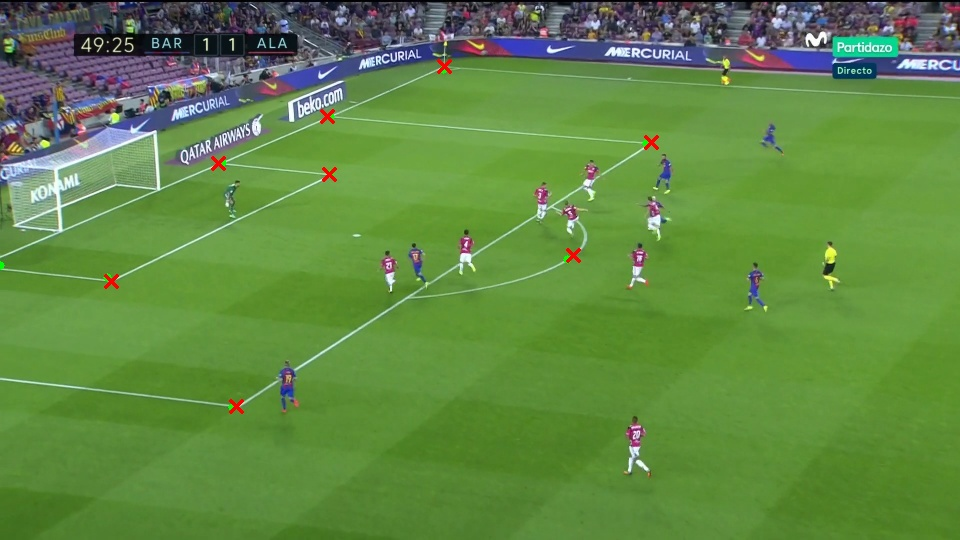

In [72]:
VIS_DIR_29 = "visualizations/29"  
Image(VIS_DIR_29 + "/02416.jpg")

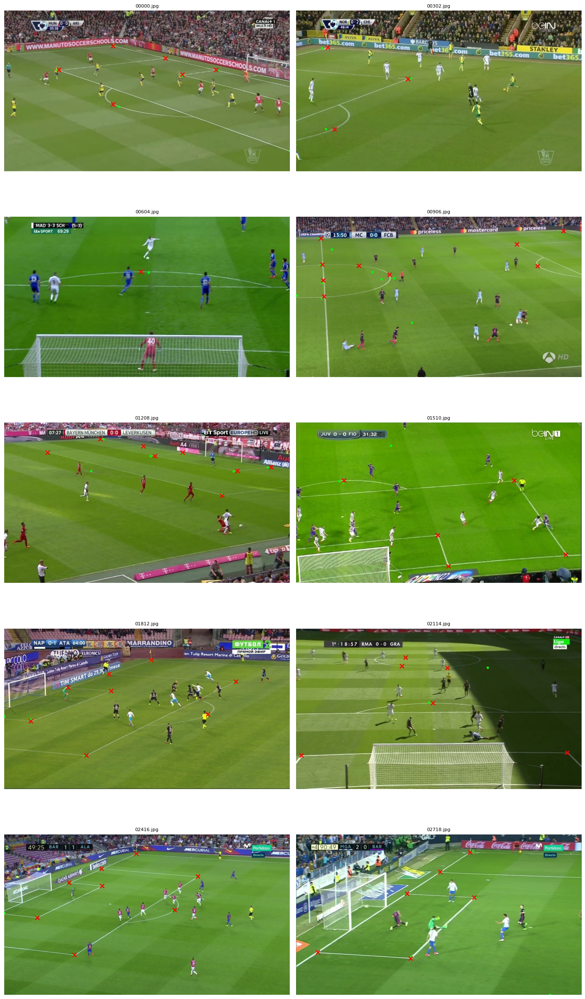

In [54]:
imgs_29 = [f for f in os.listdir(VIS_DIR_29) if f.lower().endswith((".jpg", ".png"))]
imgs_29 = sorted(imgs_29)

n = len(imgs_29)
cols = 2
rows = math.ceil(n / cols)

plt.figure(figsize=(cols * 7, rows * 5))

for i, fname in enumerate(imgs_29):
    plt.subplot(rows, cols, i + 1)
    img = PILImage.open(os.path.join(VIS_DIR_29, fname))
    plt.imshow(img)
    plt.title(fname, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

### Métricas de visibilización

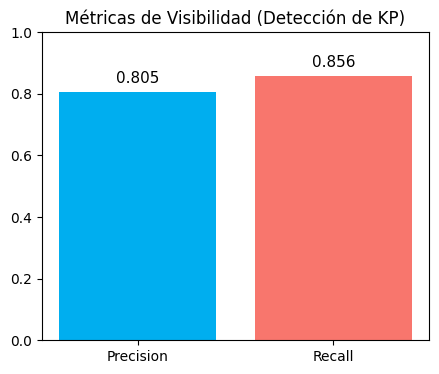

In [ ]:
vis_29 = json.load(open("evaluation_outputs/29/visibility.json"))
vals_29 = [vis_29["precision"], vis_29["recall"]]
labels = ["Precision", "Recall"]
colors = ["#00AEEF", "#F8766D"]

plt.figure(figsize=(5,4))
bars = plt.bar(labels, vals_29, color=colors)
plt.ylim(0,1)
plt.title("Métricas de Visibilidad (Detección de KP)")

for bar, val in zip(bars, vals_29):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.02,              
        f"{val:.3f}",               
        ha="center", va="bottom",
        fontsize=11
    )

plt.show()

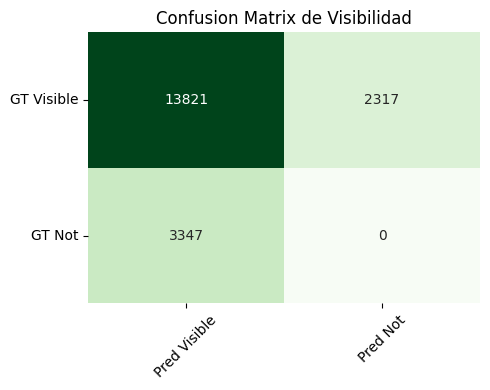

In [56]:
import seaborn as sns; 

tp = vis_29["true_positive"]
fp = vis_29["false_positive"]
fn = vis_29["false_negative"]
tn = 0   # no existe en el task, pero lo dejamos para el heatmap

cm = np.array([
    [tp, fn],
    [fp, tn]
])

plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", cbar=False)

plt.xticks([0.5, 1.5], ["Pred Visible", "Pred Not"], rotation=45)
plt.yticks([0.5, 1.5], ["GT Visible", "GT Not"], rotation=0)

plt.title("Confusion Matrix de Visibilidad")
plt.tight_layout()
plt.show()

### RMSE

#### Por Keypoint

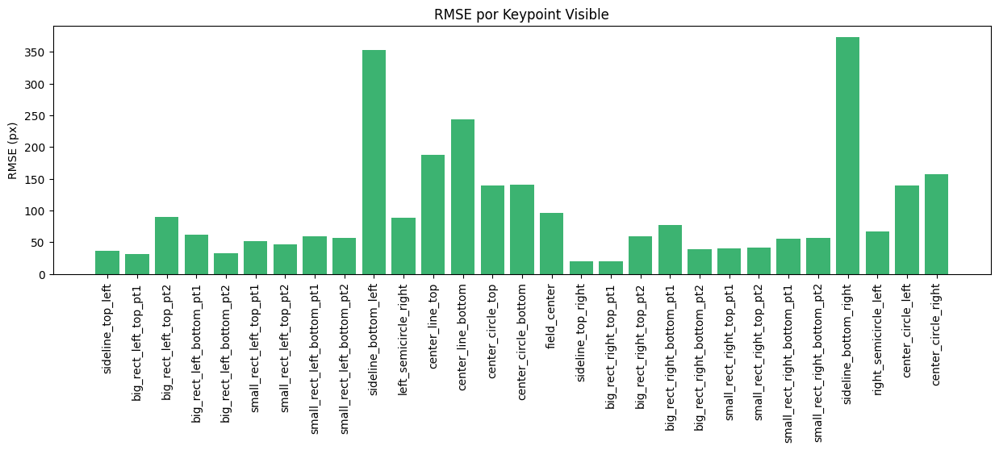

In [57]:
plt.figure(figsize=(15,4))
plt.bar(rmse_29["keypoint_name"], rmse_29["rmse"], color = "mediumseagreen")
plt.xticks(rotation=90)
plt.title("RMSE por Keypoint Visible")
plt.ylabel("RMSE (px)")
plt.show()

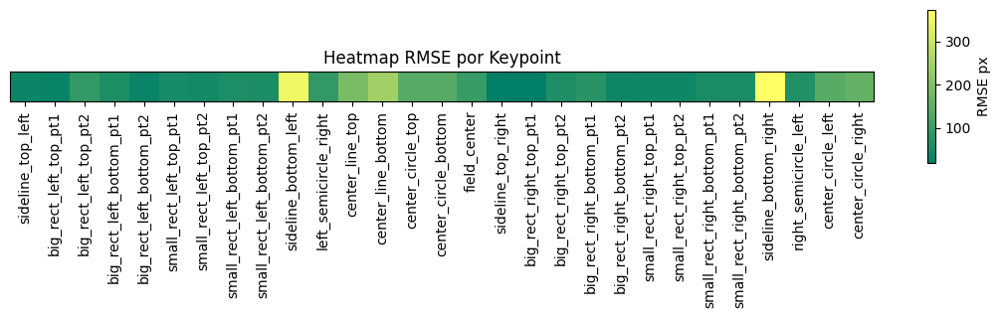

In [58]:
plt.figure(figsize=(14,2))
plt.imshow([rmse_29["rmse"]], cmap="summer")
plt.xticks(range(len(rmse_29)), rmse_29["keypoint_name"], rotation=90)
plt.yticks([])
plt.colorbar(label="RMSE px")
plt.title("Heatmap RMSE por Keypoint")
plt.show()


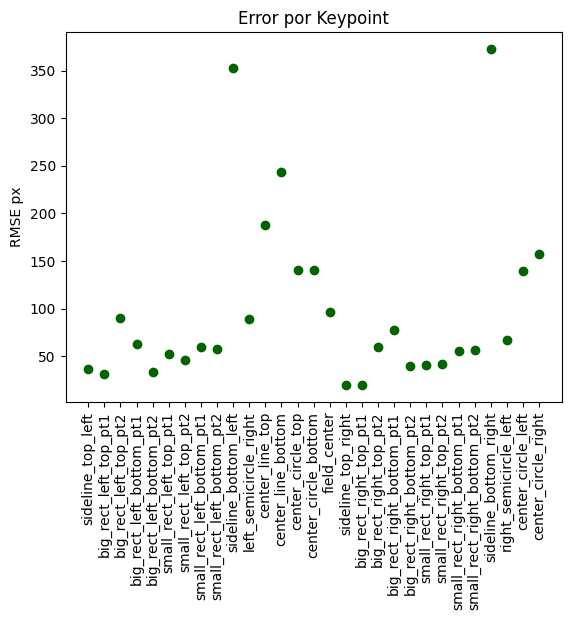

In [59]:
plt.scatter(range(29), rmse_29["rmse"], color = "darkgreen")
plt.xticks(range(29), rmse_29["keypoint_name"], rotation=90)
plt.title("Error por Keypoint")
plt.ylabel("RMSE px")
plt.show()

#### Por frame

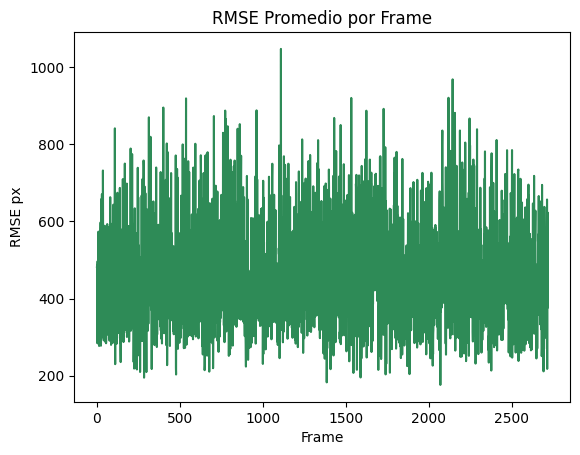

In [60]:
err_29 = pd.read_csv("evaluation_outputs/29/errors_by_frame.csv")
err_29["mean_err"] = err_29.iloc[:,1:].mean(axis=1)

plt.plot(err_29["frame"], err_29["mean_err"], color = "seagreen")
plt.title("RMSE Promedio por Frame")
plt.xlabel("Frame")
plt.ylabel("RMSE px")
plt.show()


### Confianzas

C:\Users\anapt\AppData\Local\Temp\ipykernel_25932\1666937953.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([conf_29[k] for k in conf_29.columns[1:]], labels=conf_29.columns[1:])


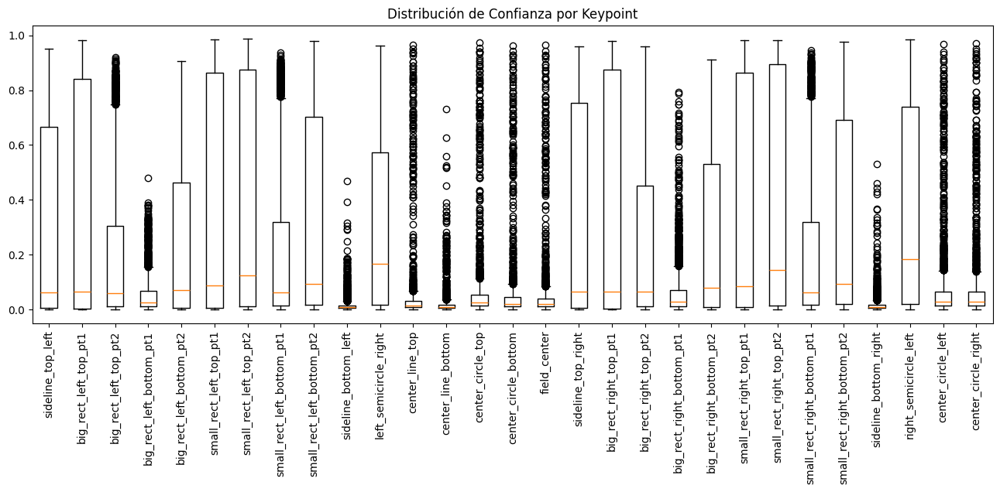

In [61]:
conf_29 = pd.read_csv("evaluation_outputs/29/confidences.csv")

plt.figure(figsize=(16,5))
plt.boxplot([conf_29[k] for k in conf_29.columns[1:]], labels=conf_29.columns[1:])
plt.xticks(rotation=90)
plt.title("Distribución de Confianza por Keypoint")
plt.show()

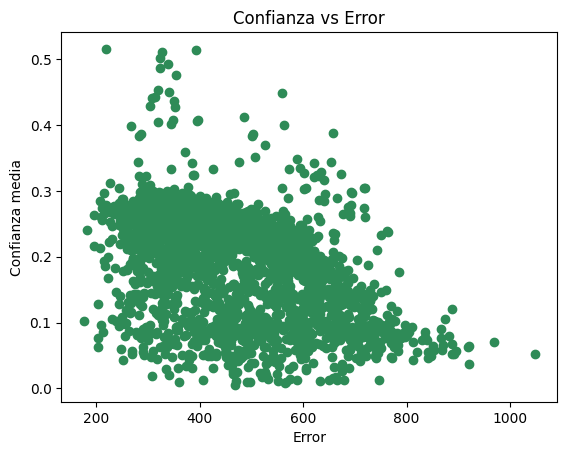

In [62]:
plt.scatter(err_29["mean_err"], conf_29.iloc[:,1:].mean(axis=1), color = "seagreen")
plt.xlabel("Error")
plt.ylabel("Confianza media")
plt.title("Confianza vs Error")
plt.show()

### Análisis

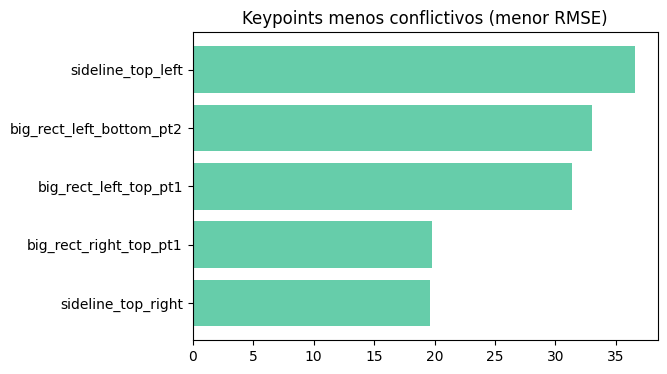

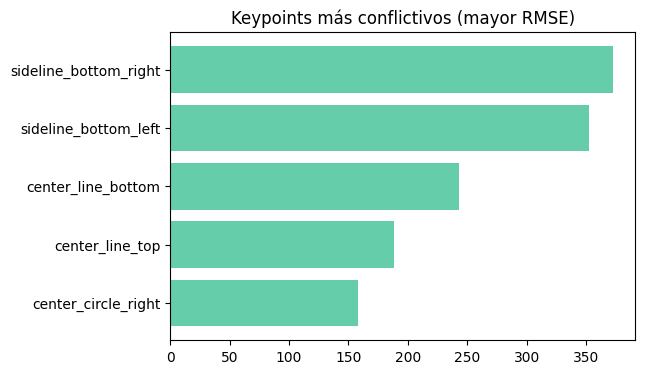

In [63]:
rmse_29_sorted = rmse_29.sort_values("rmse")

plt.figure(figsize=(6,4))
plt.barh(rmse_29_sorted.head(5)["keypoint_name"], rmse_29_sorted.head(5)["rmse"], color = "mediumaquamarine")
plt.title("Keypoints menos conflictivos (menor RMSE)")
plt.show()

plt.figure(figsize=(6,4))
plt.barh(rmse_29_sorted.tail(5)["keypoint_name"], rmse_29_sorted.tail(5)["rmse"], color = "mediumaquamarine")
plt.title("Keypoints más conflictivos (mayor RMSE)")
plt.show()

## `57 KP Model`

In [64]:
rmse_57 = pd.read_csv("evaluation_outputs/57/results_keypoints.csv")
res_57  = json.load(open("evaluation_outputs/57/results_keypoints.json"))
VIS_DIR_57 = "visualizations/57"  

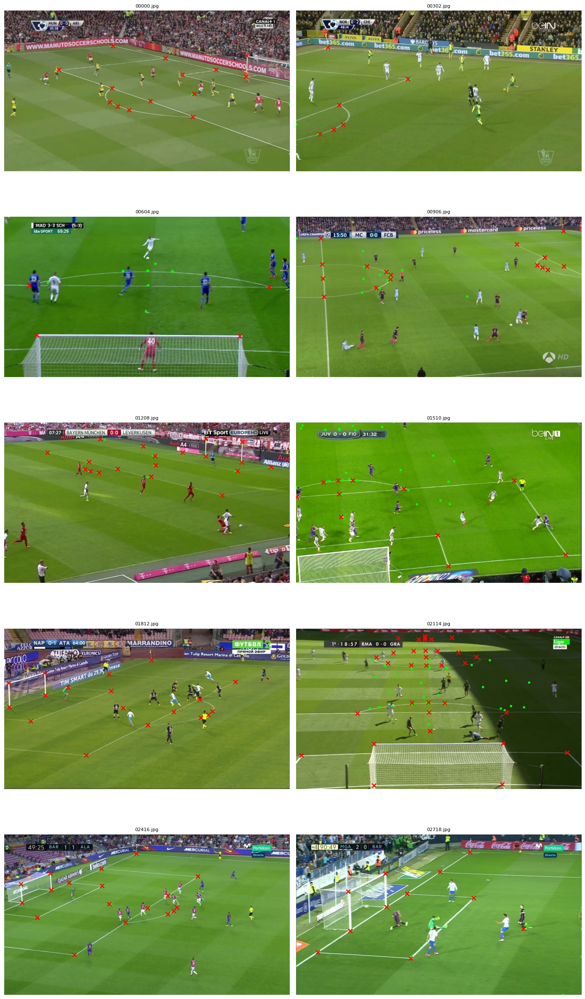

In [65]:
imgs_57 = [f for f in os.listdir(VIS_DIR_57) if f.lower().endswith((".jpg", ".png"))]
imgs_57 = sorted(imgs_57)

n = len(imgs_57)
cols = 2
rows = math.ceil(n / cols)

plt.figure(figsize=(cols * 7, rows * 5))

for i, fname in enumerate(imgs_57):
    plt.subplot(rows, cols, i + 1)
    img = PILImage.open(os.path.join(VIS_DIR_57, fname))
    plt.imshow(img)
    plt.title(fname, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

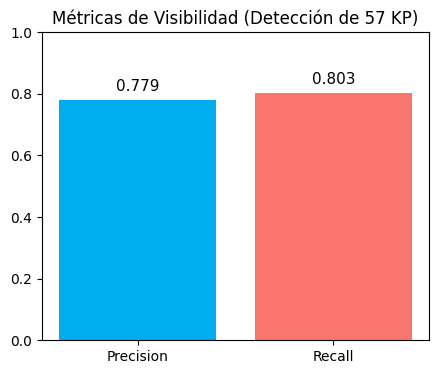

In [ ]:
vis_57 = json.load(open("evaluation_outputs/57/visibility.json"))
vals_57 = [vis_57["precision"], vis_57["recall"]]
labels = ["Precision", "Recall"]
colors = ["#00AEEF", "#F8766D"]

plt.figure(figsize=(5,4))
bars = plt.bar(labels, vals_57, color=colors)
plt.ylim(0,1)
plt.title("Métricas de Visibilidad (Detección de 57 KP)")

for bar, val in zip(bars, vals_57):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.02,             
        f"{val:.3f}",               
        ha="center", va="bottom",
        fontsize=11
    )

plt.show()

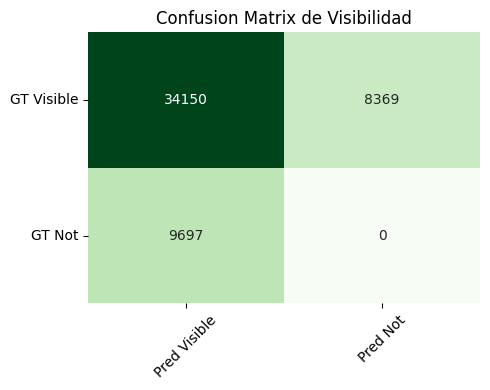

In [ ]:
import seaborn as sns; 

tp = vis_57["true_positive"]
fp = vis_57["false_positive"]
fn = vis_57["false_negative"]
tn = 0  

cm = np.array([
    [tp, fn],
    [fp, tn]
])

plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", cbar=False)

plt.xticks([0.5, 1.5], ["Pred Visible", "Pred Not"], rotation=45)
plt.yticks([0.5, 1.5], ["GT Visible", "GT Not"], rotation=0)

plt.title("Confusion Matrix de Visibilidad")
plt.tight_layout()
plt.show()

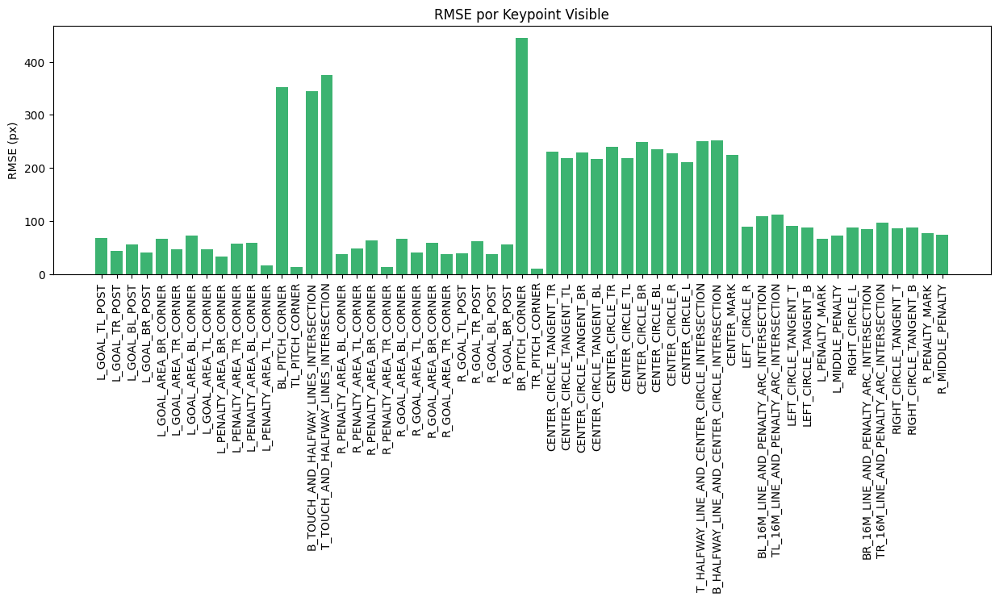

In [68]:
plt.figure(figsize=(15,4))
plt.bar(rmse_57["keypoint_name"], rmse_57["rmse"], color = "mediumseagreen")
plt.xticks(rotation=90)
plt.title("RMSE por Keypoint Visible")
plt.ylabel("RMSE (px)")
plt.show()

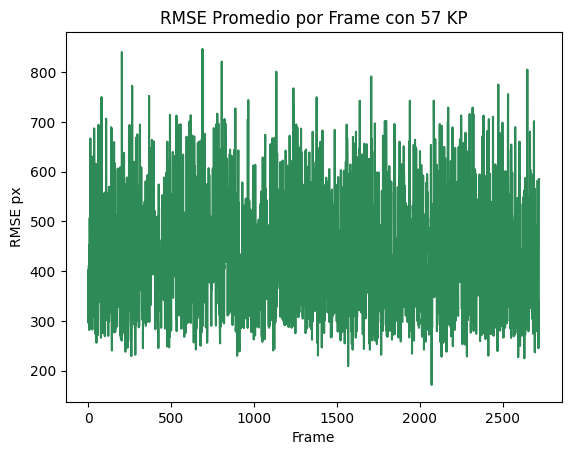

In [69]:
err_57 = pd.read_csv("evaluation_outputs/57/errors_by_frame.csv")
err_57["mean_err"] = err_57.iloc[:,1:].mean(axis=1)

plt.plot(err_57["frame"], err_57["mean_err"], color = "seagreen")
plt.title("RMSE Promedio por Frame con 57 KP")
plt.xlabel("Frame")
plt.ylabel("RMSE px")
plt.show()


C:\Users\anapt\AppData\Local\Temp\ipykernel_25932\3888083230.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([conf_57[k] for k in conf_57.columns[1:]], labels=conf_57.columns[1:])


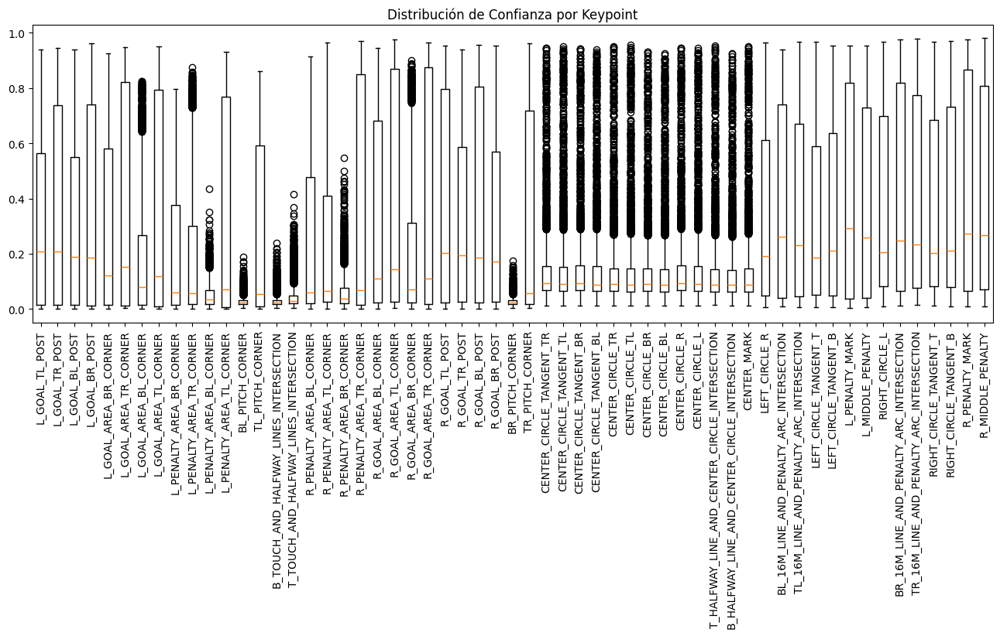

In [70]:
conf_57 = pd.read_csv("evaluation_outputs/57/confidences.csv")

plt.figure(figsize=(16,5))
plt.boxplot([conf_57[k] for k in conf_57.columns[1:]], labels=conf_57.columns[1:])
plt.xticks(rotation=90)
plt.title("Distribución de Confianza por Keypoint")
plt.show()

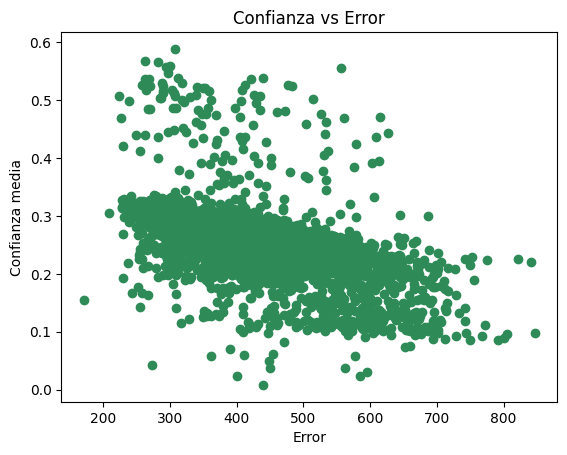

In [71]:
plt.scatter(err_57["mean_err"], conf_57.iloc[:,1:].mean(axis=1), color = "seagreen")
plt.xlabel("Error")
plt.ylabel("Confianza media")
plt.title("Confianza vs Error")
plt.show()